## Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stat
from scipy.stats import zscore
from sklearn.linear_model import LinearRegression
from sklearn.naive_bayes import MultinomialNB,GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
import xgboost
from xgboost import XGBRegressor
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve,roc_auc_score
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
import joblib
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None) # to see all the rows
pd.set_option('display.max_columns', None) # to see all the columns

## Importing and Exploring Dataset.

In [2]:
Doctor_Tr=pd.read_csv('Doctor_Train.csv',sep='	')

In [3]:
Doctor_Tr.shape

(5961, 7)

Doctor_Tr dataset has 59861 rows and 7 columns.

In [4]:
Doctor_Tr.head()

,Qualification,Experience,Rating,Location,Profile,Miscellaneous_Info,Fees
0,"BHMS, MD - Homeopathy",24,100%,Ernakulam,Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100
1,"BAMS, MD - Ayurveda Medicine",12,98%,Bangalore,Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350
2,"MBBS, MS - Otorhinolaryngology",9,NaN,Bangalore,ENT Specialist,NaN,300
3,"BSc - Zoology, BAMS",12,NaN,Bangalore,Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250
4,BAMS,20,100%,Chennai,Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250


These first five rows of the dataset.

In [7]:
Doctor_Tr.tail()

,Qualification,Experience,Rating,Location,Profile,Miscellaneous_Info,Fees
5956,"MBBS, MS - ENT",19,98%,Bangalore,ENT Specialist,"98% 45 Feedback Basavanagudi, Bangalore",300
5957,MBBS,33,NaN,Chennai,General Medicine,NaN,100
5958,MBBS,41,97%,Delhi,General Medicine,"97% 11 Feedback Greater Kailash Part 2, Delhi",600
5959,"MBBS, MD - General Medicine",15,90%,Mumbai,General Medicine,General Medical Consultation Viral Fever Treat...,100
5960,"BDS, MDS - Orthodontics",17,100%,Delhi,Dentist,Acrylic Partial Denture Crowns and Bridges Fix...,200


These are bottom five rows of the dataset.

In [8]:
round(Doctor_Tr.isnull().sum()/len(Doctor_Tr) * 100,2)

Qualification          0.00
Experience             0.00
Rating                55.39
Location               0.44
Profile                0.00
Miscellaneous_Info    43.95
Fees                   0.00
dtype: float64

Above is percentage of missing data in columns,

In [9]:
Doctor_Tr.isnull().sum()

Qualification            0
Experience               0
Rating                3302
Location                26
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64

We can see there are 3302 null values in rating column and 2620 null vlaues in miscellaneous column.

In [10]:
Doctor_Tr.dtypes

Qualification         object
Experience             int64
Rating                object
Location              object
Profile               object
Miscellaneous_Info    object
Fees                   int64
dtype: object

Except fees all other columns are object type.

In [11]:
Doctor_Tr.columns

Index(['Qualification', 'Experience', 'Rating', 'Location', 'Profile',
       'Miscellaneous_Info', 'Fees'],
      dtype='object')

In [12]:
Doctor_Tr.Location.unique()

array([' Ernakulam', ' Bangalore', ' Chennai', ' Delhi', ' Hyderabad',
       ' Coimbatore', ' Mumbai', ' Thiruvananthapuram', nan, 'Delhi'],
      dtype=object)

There are 9 cites in this column and few nan values.

In [13]:
Doctor_Tr.Location.value_counts()

 Bangalore             1258
 Mumbai                1219
 Delhi                 1184
 Hyderabad              951
 Chennai                855
 Coimbatore             228
 Ernakulam              153
 Thiruvananthapuram      86
Delhi                     1
Name: Location, dtype: int64

Most of the doctors data we have are from banglore,Mumbai and Delhi.


There are two Delhi catergories one with space initially and one is without space will combine them



In [14]:
Doctor_Tr.Profile.unique()

array(['Homeopath', 'Ayurveda', 'ENT Specialist', 'Dentist',
       'General Medicine', 'Dermatologists'], dtype=object)

There are 6 profiles of doctor's in this dataset.

In [15]:
Doctor_Tr.Profile.value_counts()

Dentist             1397
General Medicine    1173
Dermatologists      1034
Homeopath            843
Ayurveda             786
ENT Specialist       728
Name: Profile, dtype: int64

We have info of dentist and genral medicine doctors more.

In [16]:
Doctor_Tr.Rating.value_counts()

100%    684
98%     290
99%     259
97%     241
96%     220
95%     178
94%     115
93%     109
92%      66
90%      66
91%      60
89%      42
88%      41
85%      27
82%      23
86%      21
83%      21
80%      19
77%      16
87%      14
79%      13
84%      13
81%      12
67%      12
71%       9
76%       9
73%       8
75%       8
60%       7
74%       7
78%       6
56%       5
68%       5
70%       4
69%       4
57%       3
72%       3
64%       2
62%       2
63%       2
33%       2
55%       2
47%       1
58%       1
53%       1
36%       1
7%        1
65%       1
40%       1
45%       1
48%       1
Name: Rating, dtype: int64

We can see there is no 0 rating ,so we will replace NaN values with 0.

##### Rating column have 3302 missing values which leadds to say 55% of data is NaN.

##### We will replace the null values in the rating column with -99%

In [17]:
# Fill missing values with -99% to provide them different importance.
Doctor_Tr['Rating'].fillna('-99%',inplace=True)

# extract value of rating to avoid '%' and convert to numeric
Doctor_Tr['Rating'] = Doctor_Tr['Rating'].str.slice(stop=-1).astype(int)

In [18]:
print("0-9% ",len(Doctor_Tr[(Doctor_Tr['Rating']>0) & (Doctor_Tr['Rating']<10)]))
print("10-19% ",len(Doctor_Tr[(Doctor_Tr['Rating']>=10) & (Doctor_Tr['Rating']<20)]))
print("20-29% ",len(Doctor_Tr[(Doctor_Tr['Rating']>=20) & (Doctor_Tr['Rating']<30)]))
print("30-39% ",len(Doctor_Tr[(Doctor_Tr['Rating']>=30) & (Doctor_Tr['Rating']<40)]))
print("And so-on..")

0-9%  1
10-19%  0
20-29%  0
30-39%  3
And so-on..


In [19]:
bins = [-99,0,10,20,30,40,50,60,70,80,90,100]
labels = [i for i in range(11)]
Doctor_Tr['Rating'] = pd.cut(Doctor_Tr['Rating'], bins=bins, labels=labels, include_lowest=True)

In [20]:
Doctor_Tr['Rating'].value_counts().sort_index()
# nice it is exactly being grouped.

0     3302
1        1
2        0
3        0
4        4
5        3
6       19
7       32
8       98
9      280
10    2222
Name: Rating, dtype: int64

We have segregated the columns in range .

In [21]:
#There are no NaN values in the Rating column now.
Doctor_Tr.isnull().sum()

Qualification            0
Experience               0
Rating                   0
Location                26
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64

There are null values in Location and Miscellaneous_Info.

##### As there are lot of degress with which each doctor is qualified it is difficult for us to understand the qualification.So we will segregate the most common qulaifiaction and check how many of them that doctor has.We will define Qual function to check whether the qulaification row has the specified degree defined in it or not.

In [22]:
Doctor_Tr['Qualification_count'] = Doctor_Tr['Qualification'].apply(lambda x: len(x.split(",")))

Doctor_Tr['Qualification_count'].value_counts()

2     2628
1     1962
3      995
4      257
5       84
6       23
7        6
9        3
8        2
10       1
Name: Qualification_count, dtype: int64

In [23]:
Doctor_Tr['Qualification'].unique()

array(['BHMS, MD - Homeopathy', 'BAMS, MD - Ayurveda Medicine',
       'MBBS, MS - Otorhinolaryngology', ...,
       'MD - Dermatology , Venereology & Leprosy, MBBS, Fellowship In Dermatosurgery',
       'BDS, certification in smile designing',
       'MD - Homeopathy, Post Graduate Diploma in Healthcare Management(PGDHM), DHMS (Diploma in Homeopathic Medicine and Surgery)'],
      dtype=object)

In [24]:
Doctor_Tr["Qualification"]=Doctor_Tr["Qualification"].str.split(",")
Qualification ={}
for x in Doctor_Tr["Qualification"].values:
    for each in x:
        each = each.strip()
        if each in Qualification:
            Qualification[each]+=1
        else:
            Qualification[each]=1

##### Extract top 10 qual

In [25]:
most_qual = sorted(Qualification.items(),key=lambda x:x[1],reverse=True)[:10]
final_qual = []
for qual in most_qual:
    final_qual.append(qual[0])
    
print(final_qual)

['MBBS', 'BDS', 'BAMS', 'BHMS', 'MD - Dermatology', 'MS - ENT', 'Venereology & Leprosy', 'MD - General Medicine', 'Diploma in Otorhinolaryngology (DLO)', 'MD - Homeopathy']


##### Encode extracted top 10 qualification into train dataset as new column.

In [26]:
for qual in final_qual:
    Doctor_Tr[qual] = 0

for x,y in zip(Doctor_Tr['Qualification'].values, np.array([i for i in range(len(Doctor_Tr))])):
    for c in x:
        c = c.strip()
        if c in final_qual:
            Doctor_Tr[c][y] = 1

##### Now we can drop the extra quali which we added 

In [27]:
Doctor_Tr.drop(['Qualification','Qualification_count'],axis=1,inplace=True)

In [28]:
#We will replace the null values in the Location column with mode(i.e Bangalore).

In [29]:
#Doctor_Tr['Location'].replace(NaN,Doctor_Tr['Location'].mode,inplace=True)
Doctor_Tr['Location']=Doctor_Tr['Location'].fillna(' Bangalore')

In [30]:
 Doctor_Tr['Location'].replace(' Delhi','Delhi', inplace=True)

In [31]:
Doctor_Tr.isnull().sum()

Experience                                 0
Rating                                     0
Location                                   0
Profile                                    0
Miscellaneous_Info                      2620
Fees                                       0
MBBS                                       0
BDS                                        0
BAMS                                       0
BHMS                                       0
MD - Dermatology                           0
MS - ENT                                   0
Venereology & Leprosy                      0
MD - General Medicine                      0
Diploma in Otorhinolaryngology (DLO)       0
MD - Homeopathy                            0
dtype: int64

##### Now we don't have any null values in Location

In [32]:
Doctor_Tr.to_csv('Doctor_Tr_correct.csv',index=False)

In [33]:
Doctor_Tr.head(3)

,Experience,Rating,Location,Profile,Miscellaneous_Info,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy
0,24,10,Ernakulam,Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100,0,0,0,1,0,0,0,0,0,1
1,12,10,Bangalore,Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350,0,0,1,0,0,0,0,0,0,0
2,9,0,Bangalore,ENT Specialist,NaN,300,1,0,0,0,0,0,0,0,0,0


In [34]:
Doctor_Tr.describe()

,Experience,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy
count,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000
mean,17.303976,307.944640,0.470559,0.228485,0.127831,0.125482,0.101493,0.068948,0.049153,0.047811,0.041772,0.030364
std,11.142798,190.920373,0.499174,0.419892,0.333929,0.331293,0.302006,0.253387,0.216205,0.213384,0.200083,0.171601
min,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,14.000000,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,500.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,66.000000,950.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [35]:
Doctor_Tr.shape

(5961, 16)

##### Now after segregating the qualification column with each degree in one column and droping the qualificationa nd miscellaneous_info coumn our dataset dimensions are changed to 5961 rows and 16 columns.

## Exploratory Analysis

### Univariate Analysis

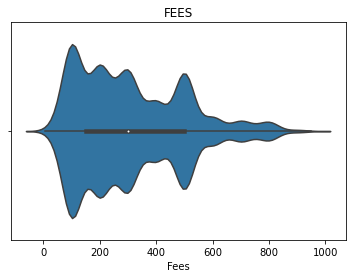

In [36]:
sns.violinplot(Doctor_Tr['Fees'])
plt.title('FEES')
plt.show()

Observation:
    
Above plot helps us in understanding that most doctors charge Rs: 100 to 300.

Also few doctors charge in range of Rs:500.    

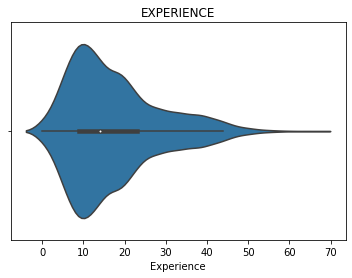

In [37]:
sns.violinplot(Doctor_Tr['Experience'])
plt.title('EXPERIENCE')
plt.show()

Observation:
    
Above plots justify that we have majority of data with doctors 5 to 20 years of experience  .

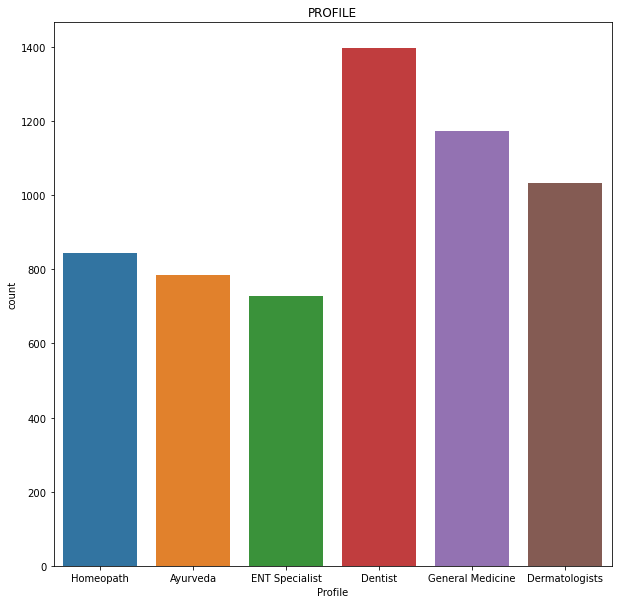

In [38]:
plt.figure(figsize=(10,10))
sns.countplot(Doctor_Tr['Profile'])
plt.title('PROFILE')
plt.show()

Observation:
    
1)We have more dentist in dataset.

2)ENT specialist are the least in dataset.

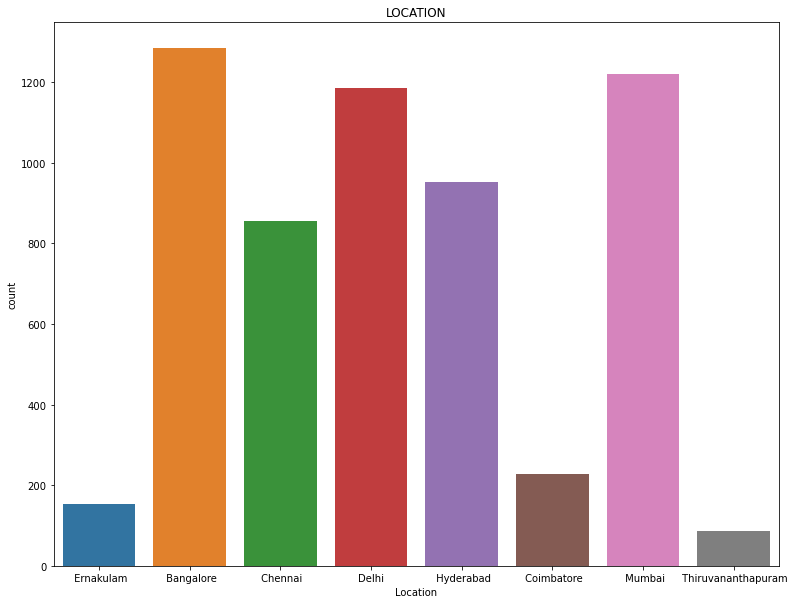

In [39]:
plt.figure(figsize=(13,10))
sns.countplot(Doctor_Tr['Location'])
plt.title('LOCATION')
plt.show()

Observation:
    
1)We have more data of metro cities Delhi,Bangalore and Mumbai.

2)We have least data of Ernakulam ,coimbatore and thiruvananthapuram.

### Bivariate Analysis

In [40]:
Doctor_Tr.columns

Index(['Experience', 'Rating', 'Location', 'Profile', 'Miscellaneous_Info',
       'Fees', 'MBBS', 'BDS', 'BAMS', 'BHMS', 'MD - Dermatology', 'MS - ENT',
       'Venereology & Leprosy', 'MD - General Medicine',
       'Diploma in Otorhinolaryngology (DLO)', 'MD - Homeopathy'],
      dtype='object')

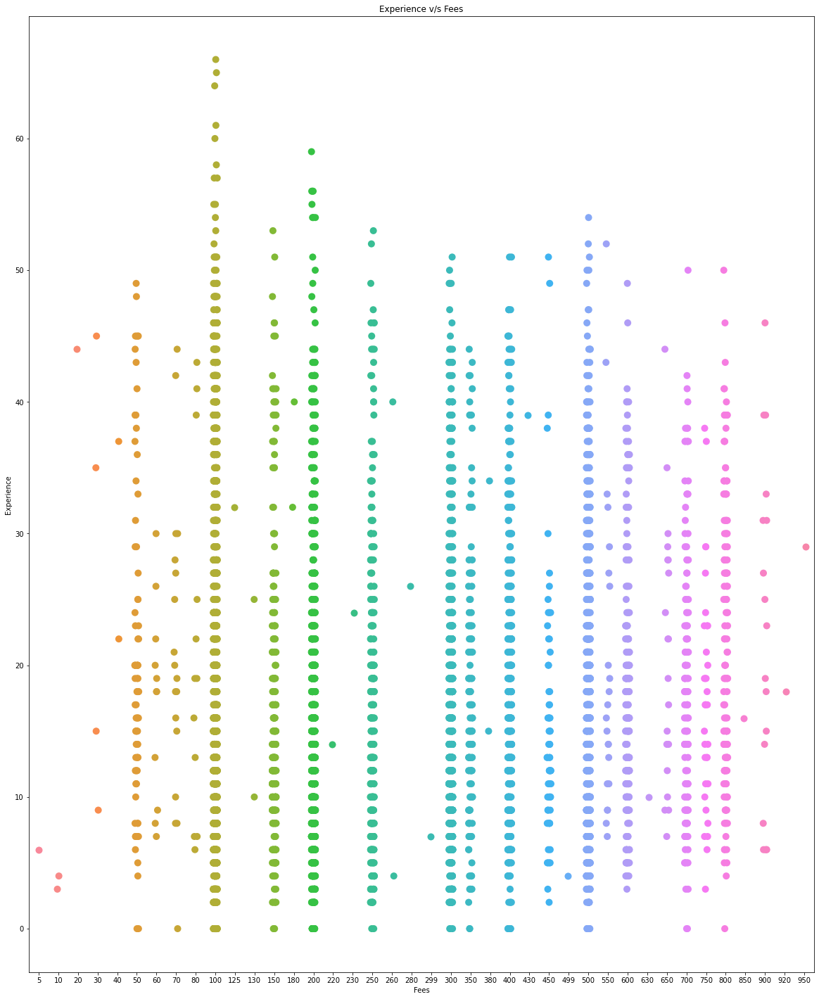

In [41]:
plt.figure(figsize=(20,25))
sns.stripplot(y='Experience',x='Fees',data=Doctor_Tr,size=10)
plt.title('Experience v/s Fees')
plt.show()

Observation:
    
1)Only doctors with more than 60 years charge Rs: 100.
2)Most of doctors ranging from 50 to 60 years charge Rs. 200.
3)We can say doctors with high expirence usualy charge lesser.

<Figure size 1440x1800 with 0 Axes>

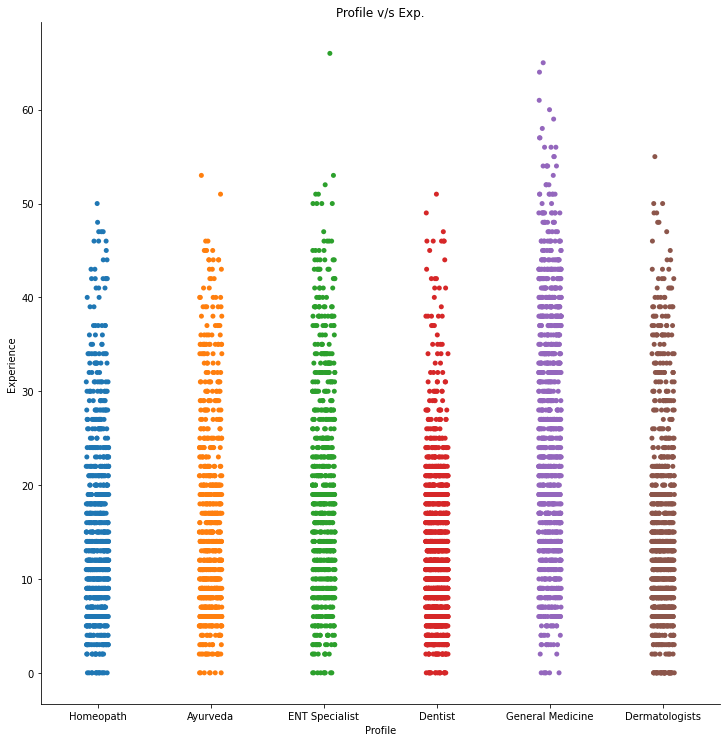

In [42]:
plt.figure(figsize=(20,25))
sns.catplot(x='Profile',y='Experience',data=Doctor_Tr,size=10)
plt.title('Profile v/s Exp.')
plt.show()

Observations:
    
1)We have more expirenced doctors in Genral Medicine profile.

2)Dentist have the least experience in comparision with other profile doctors.

3)Ayurveda and Dermatologist have similar years of experience in this dataset.


<Figure size 360x1080 with 0 Axes>

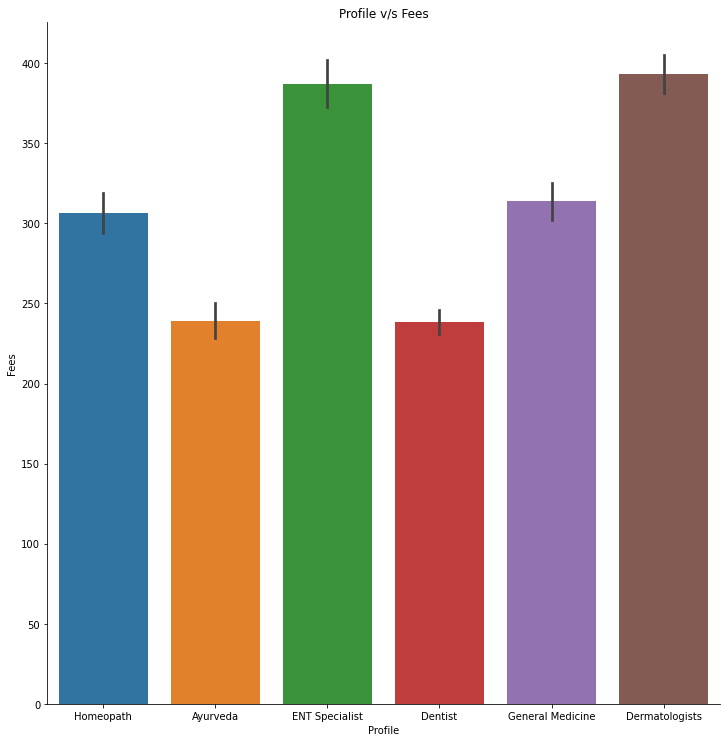

In [43]:
plt.figure(figsize=(5,15))
sns.catplot(x='Profile',y='Fees',data=Doctor_Tr,size=10,kind='bar')
plt.title('Profile v/s Fees')
plt.show()

Observations:
    
1)We can conclude that dermatologist charge the highest in all all profiles.

2)Fee charges of ENT specialist is also very similar to that of dermatologist.

3)Ayurveda and dentist charge the least in all profiles closer to Rs: 250.
    
4)Homeopath and Genral Medicine charge in similar range of Rs 300 to 330.   

<Figure size 360x1080 with 0 Axes>

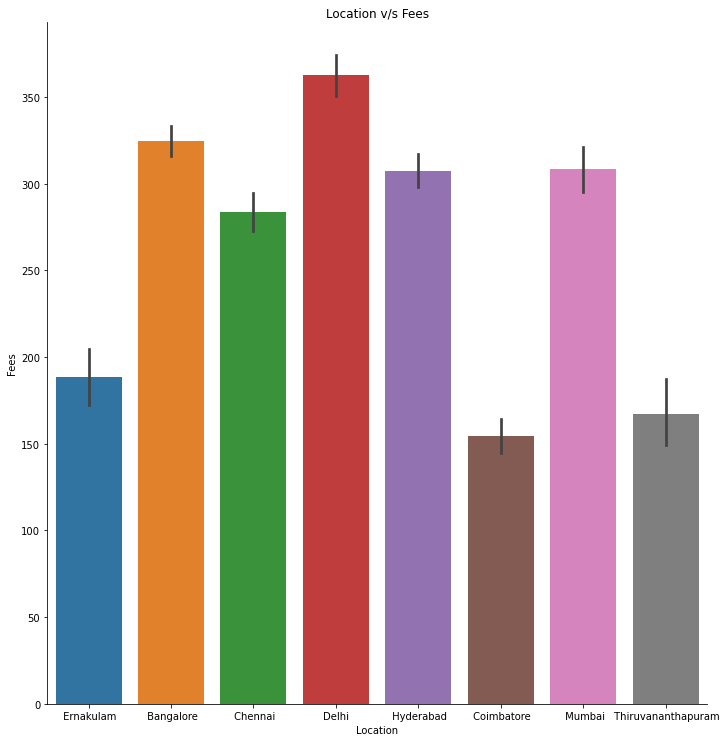

In [44]:
plt.figure(figsize=(5,15))
sns.catplot(x='Location',y='Fees',data=Doctor_Tr,size=10,kind='bar')
plt.title('Location v/s Fees')
plt.show()

Observations:
    
1)Delhi has the highest fee charges for doctors.Charges in Delhi are more than Rs:350.
    
2)Doctors in Mumbai,Bangalore and Hyderabad charge in similar range of more tha Rs:300.
        
3)Chennai doctors charge around Rs:280.
    
4)Doctors from Ernakulam,Coimbatore and Thiruvananthapuram charge the least ranging from Rs:150 to 200.
    
5)We conclude doctors in metropolian cities charge higher .    

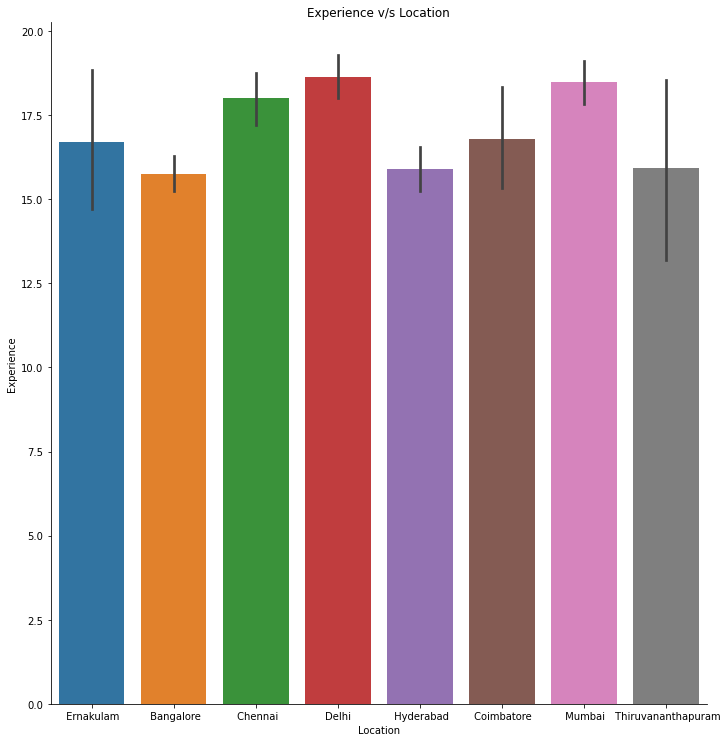

In [45]:
sns.catplot(y='Experience',x='Location',data=Doctor_Tr,size=10,kind='bar')
plt.title('Experience v/s Location')
plt.show()

Observations:

1)There are more experienced doctors in delhi,mumbai and chennai.    

2)Doctors in banglore and hyderabad have the least exp. compared to other cities.

3)Cities Eranakulam and coimbatore have similar experi.


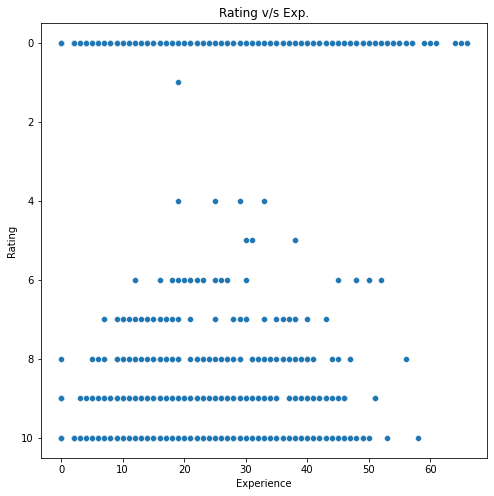

In [46]:
plt.figure(figsize=(8,8))
sns.scatterplot(y='Rating',x='Experience',data=Doctor_Tr)
plt.title('Rating v/s Exp.')
plt.show()

Observation:
    
1)Rating and experience have no relation.


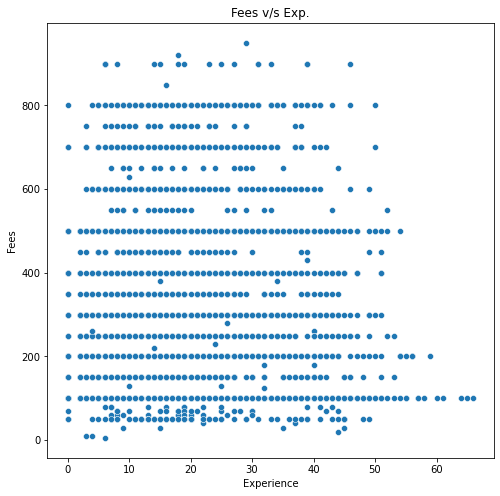

In [47]:
plt.figure(figsize=(8,8))
sns.scatterplot(y='Fees',x='Experience',data=Doctor_Tr)
plt.title('Fees v/s Exp.')
plt.show()

Observation:
    
1)Fees and experi. have no correlation.    

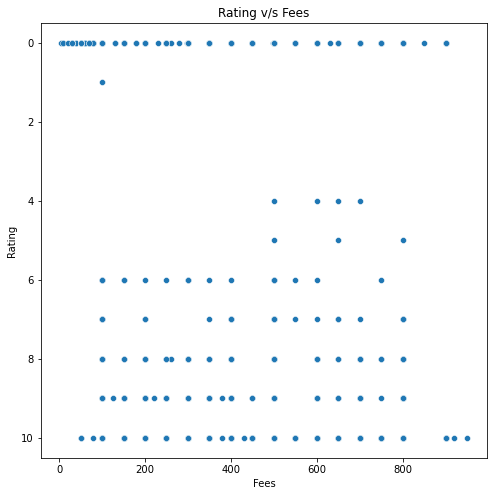

In [48]:
plt.figure(figsize=(8,8))
sns.scatterplot(y='Rating',x='Fees',data=Doctor_Tr)
plt.title('Rating v/s Fees')
plt.show()

Observation:
    
1)We cannot justify any relation between rating and fees as more than 50% data in rating was missing initialy.m    

### Multivariate Analysis

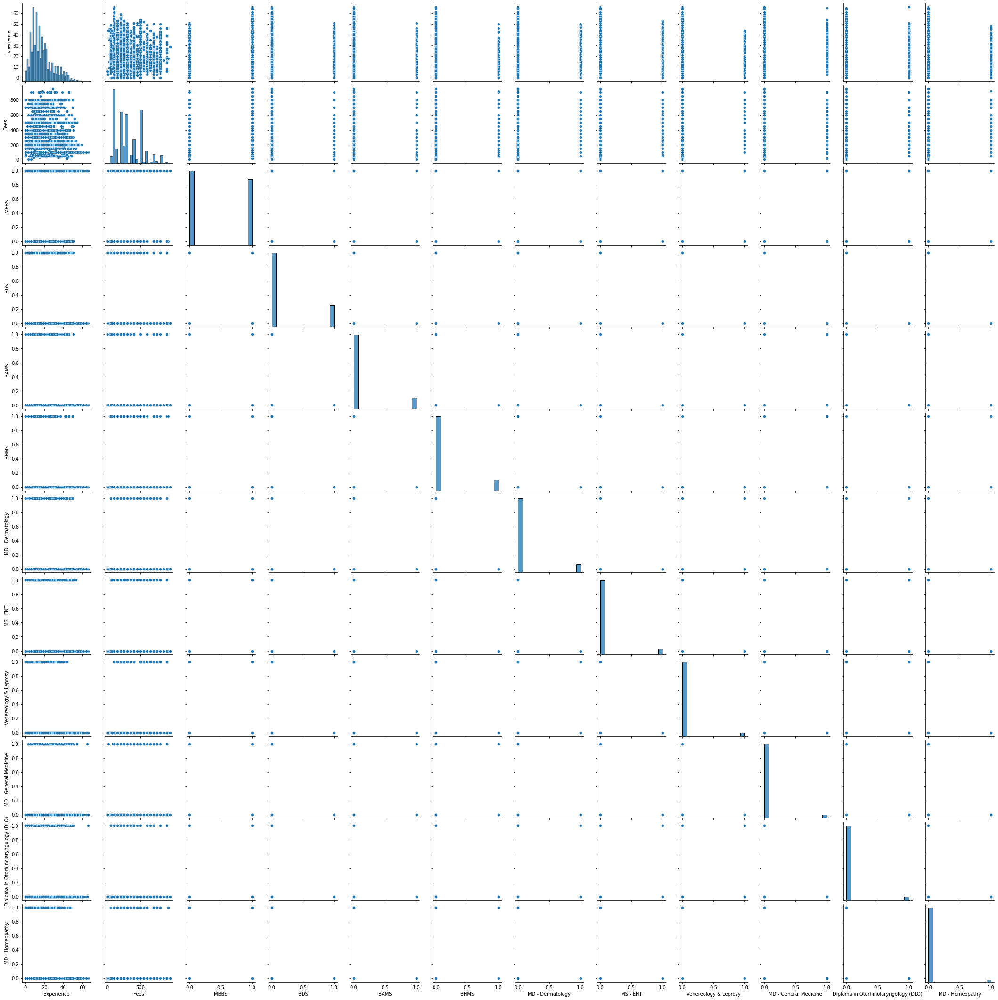

In [49]:
sns.pairplot(Doctor_Tr)

In [50]:
#columns2=['DLO','DNB','BDS','MD','MS','FELLOWSHIP','MBBS','BHMS','BAMS','DDVL']
#columns2

In [51]:
#summ=np.zeros(len(Doctor_Tr))
#for i in columns2:
#  arr=Doctor_Tr[i]
#  summ=np.add(summ,arr)

In [52]:
#temp_df=pd.DataFrame({'qual':summ})
#temp_df

In [53]:
#Doctor_Tr.drop(labels=columns2,axis=1,inplace=True)

In [54]:
#Doctor_Tr.head()

In [55]:
#qual=temp_df['qual']

In [56]:
#qual

In [57]:

#Doctor_Tr=pd.concat([qual,Doctor_Tr],axis=1)
#Doctor_Tr.head()

## ENCODING

#### Apply One Hot encoding for column Profile and Loction.

In [58]:
from sklearn.preprocessing import OneHotEncoder
#from sklearn.preprocessing import OrdinalEncoder
#from sklearn.preprocessing import LabelEncoder

In [59]:
OHC=OneHotEncoder(handle_unknown='ignore', sparse=False)
#OE=OrdinalEncoder()
#LE=LabelEncoder()

In [60]:
Doctor_Tr = pd.get_dummies(Doctor_Tr,columns=['Location','Profile'], prefix=['Location','Profile'])
#Doctor_Tr['Profile']=OE.fit_transform(Doctor_Tr['Profile'].values.reshape(-1,1))
#Doctor_Tr['Location']=OE.fit_transform(Doctor_Tr['Location'].values.reshape(-1,1))
#Doctor_Tr['Location']=LE.fit_transform(Doctor_Tr['Location'].values.reshape(-1,1))
#Doctor_Tr['Profile']=LE.fit_transform(Doctor_Tr['Profile'].values.reshape(-1,1))

In [61]:
Doctor_Tr.head()

,Experience,Rating,Miscellaneous_Info,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_ Bangalore,Location_ Chennai,Location_ Coimbatore,Location_ Ernakulam,Location_ Hyderabad,Location_ Mumbai,Location_ Thiruvananthapuram,Location_Delhi,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
0,24,10,"100% 16 Feedback Kakkanad, Ernakulam",100,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,12,10,"98% 76 Feedback Whitefield, Bangalore",350,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,9,0,NaN,300,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3,12,0,"Bannerghatta Road, Bangalore ₹250 Available on...",250,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,20,10,"100% 4 Feedback Keelkattalai, Chennai",250,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0


##### We will drop the column Miscellaneous_Info as it has lot of data which cannot be clear.

In [62]:
Doctor_Tr.drop(['Miscellaneous_Info'],axis=1,inplace=True)

In [63]:
Doctor_Tr.head()

,Experience,Rating,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_ Bangalore,Location_ Chennai,Location_ Coimbatore,Location_ Ernakulam,Location_ Hyderabad,Location_ Mumbai,Location_ Thiruvananthapuram,Location_Delhi,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
0,24,10,100,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,12,10,350,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,9,0,300,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3,12,0,250,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,20,10,250,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0


## CORRELATION

In [64]:
Doctor_Tr.corr()

,Experience,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_ Bangalore,Location_ Chennai,Location_ Coimbatore,Location_ Ernakulam,Location_ Hyderabad,Location_ Mumbai,Location_ Thiruvananthapuram,Location_Delhi,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
Experience,1.000000,0.002117,0.271347,-0.196268,-0.047150,-0.114191,-0.067704,0.093778,-0.120213,0.097549,0.111103,0.008510,-0.072419,0.026078,-0.009287,-0.008617,-0.054732,0.053884,-0.014791,0.059751,-0.042496,-0.201596,-0.096003,0.082435,0.335864,-0.070010
Fees,0.002117,1.000000,0.271038,-0.198635,-0.139891,-0.002423,0.163811,0.128413,0.113091,0.040921,0.011560,0.018601,0.045066,-0.052178,-0.160503,-0.101609,-0.000997,0.000925,-0.089157,0.143421,-0.140812,-0.202126,0.204426,0.155084,0.015463,-0.003072
MBBS,0.271347,0.271038,1.000000,-0.512244,-0.358911,-0.355083,0.314207,0.263449,0.213185,0.220358,0.206347,-0.164871,0.005562,0.062971,-0.051322,-0.053123,0.036254,-0.051340,-0.063328,0.022223,-0.364432,-0.520789,0.419355,0.358680,0.499656,-0.375863
BDS,-0.196268,-0.198635,-0.512244,1.000000,-0.208341,-0.206141,-0.182900,-0.148092,-0.123730,-0.121943,-0.113622,-0.096301,-0.056736,0.033793,0.185212,0.091064,-0.003589,-0.065901,0.078242,-0.049813,-0.212086,0.983629,-0.249302,-0.202977,-0.269357,-0.220862
BAMS,-0.047150,-0.139891,-0.358911,-0.208341,1.000000,-0.145019,-0.128669,-0.104182,-0.087044,-0.078722,-0.079932,-0.067747,0.054831,-0.077825,-0.076347,-0.020835,-0.019987,0.102361,0.021094,-0.034594,0.977884,-0.211808,-0.175383,-0.142793,-0.186964,-0.153933
BHMS,-0.114191,-0.002423,-0.355083,-0.206141,-0.145019,1.000000,-0.127311,-0.103082,-0.086124,-0.077760,-0.079088,0.349109,0.009708,-0.048093,-0.062339,-0.026255,-0.019823,0.035203,-0.011855,0.058755,-0.147626,-0.209572,-0.172193,-0.141285,-0.186217,0.930441
MD - Dermatology,-0.067704,0.163811,0.314207,-0.182900,-0.128669,-0.127311,1.000000,-0.091460,0.637946,-0.075311,-0.064618,-0.059475,-0.015293,0.003524,-0.040957,0.001657,0.017416,-0.029916,-0.040663,0.058088,-0.130983,-0.185944,0.729248,-0.123660,-0.163558,-0.136402
MS - ENT,0.093778,0.128413,0.263449,-0.148092,-0.104182,-0.103082,-0.091460,1.000000,-0.061872,-0.060978,0.168226,-0.048156,0.005590,0.007649,-0.023199,0.001888,-0.013687,-0.014853,-0.032925,0.035332,-0.106055,-0.150557,-0.124665,0.719488,-0.126366,-0.110443
Venereology & Leprosy,-0.120213,0.113091,0.213185,-0.123730,-0.087044,-0.086124,0.637946,-0.061872,1.000000,-0.050947,-0.039713,-0.040234,-0.019088,0.002157,-0.017020,0.002353,0.025972,-0.022928,-0.027508,0.032576,-0.088608,-0.125789,0.492208,-0.082433,-0.110584,-0.092275
MD - General Medicine,0.097549,0.040921,0.220358,-0.121943,-0.078722,-0.077760,-0.075311,-0.060978,-0.050947,1.000000,-0.046785,-0.039653,-0.012219,0.033920,-0.011892,-0.011510,0.050527,-0.031738,0.019044,-0.026903,-0.080357,-0.123973,-0.098500,-0.083578,0.438876,-0.086429


Above is statistical sheet for correlation between column.

#### Heat Map : Correlation

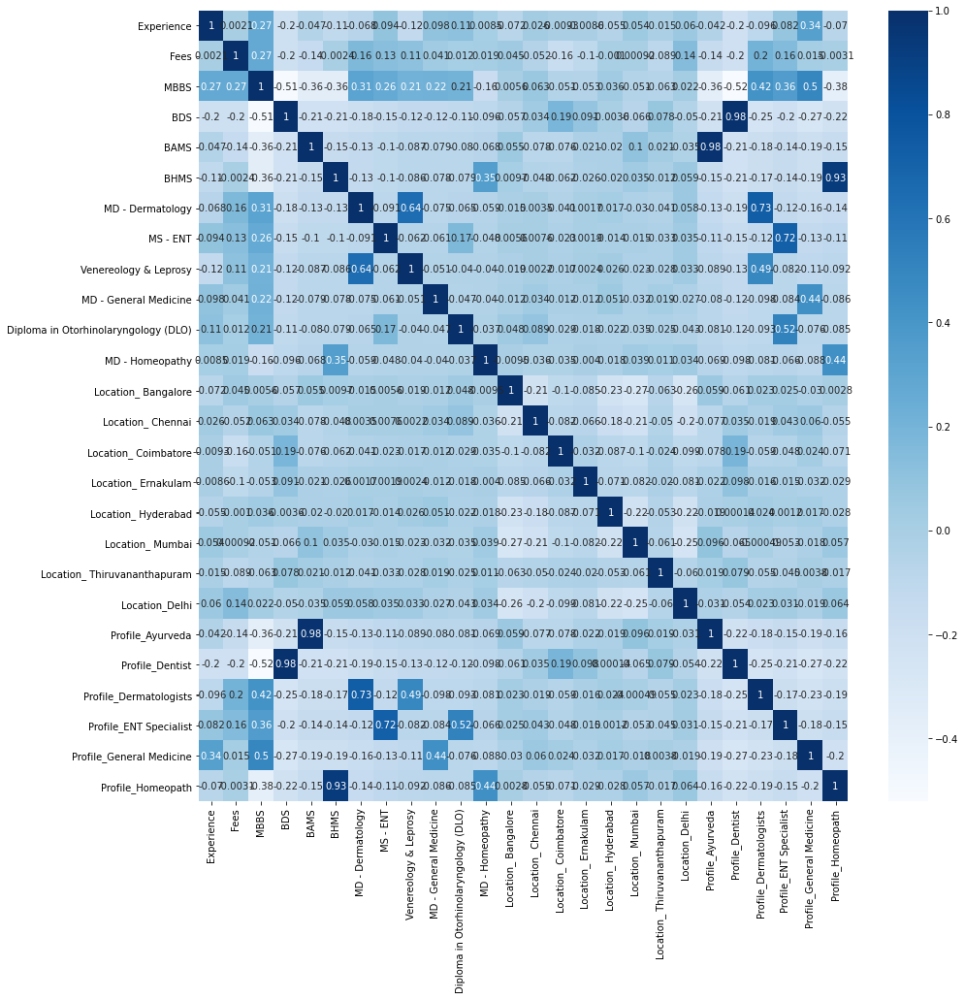

In [65]:
plt.figure(figsize=(15,15))
sns.heatmap(Doctor_Tr.corr(),annot=True,cmap='Blues')
plt.show()

Observation:
    
1)Ayurveda and BAMS are highly correlated columns.

2)Dentist and BDS are highly correlated columns.

3)Homeopath and BHMS are highly correlated columns.

## OUTLIERS

In [66]:
ncols,nrows = (3,1)

In [67]:
CN=['Experience']
CN

['Experience']

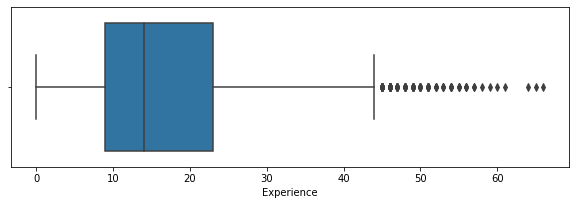

In [68]:
plt.figure(figsize=(10,10))
for index,col in enumerate(CN):
    plt.subplot(ncols,nrows,index+1)
    sns.boxplot(Doctor_Tr[CN[index]])

##### We can see outliers are present in experience column, we correct that with soft capping through Quantile method.

### Quantile

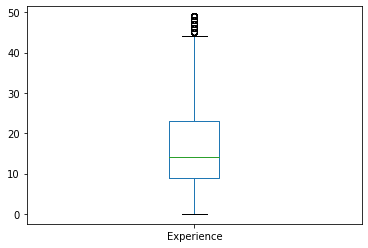

In [69]:
    q4=Doctor_Tr['Experience'].quantile(0.99)
    Doctor_Tr['Experience'][Doctor_Tr['Experience']>q4]=q4
    Doctor_Tr['Experience'].plot.box()
    plt.show()

##### Applying soft capping we have eliminated lot of outliers

In [70]:
Doctor_Tr.describe()

,Experience,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_ Bangalore,Location_ Chennai,Location_ Coimbatore,Location_ Ernakulam,Location_ Hyderabad,Location_ Mumbai,Location_ Thiruvananthapuram,Location_Delhi,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
count,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000,5961.000000
mean,17.266230,307.944640,0.470559,0.228485,0.127831,0.125482,0.101493,0.068948,0.049153,0.047811,0.041772,0.030364,0.215400,0.143432,0.038249,0.025667,0.159537,0.204496,0.014427,0.198792,0.131857,0.234357,0.173461,0.122127,0.196779,0.141419
std,11.020668,190.920373,0.499174,0.419892,0.333929,0.331293,0.302006,0.253387,0.216205,0.213384,0.200083,0.171601,0.411134,0.350543,0.191812,0.158153,0.366207,0.403367,0.119253,0.399125,0.338364,0.423632,0.378677,0.327460,0.397597,0.348483
min,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9.000000,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,14.000000,300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,500.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,49.000000,950.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [71]:
Doctor_Tr.head()

,Experience,Rating,Fees,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_ Bangalore,Location_ Chennai,Location_ Coimbatore,Location_ Ernakulam,Location_ Hyderabad,Location_ Mumbai,Location_ Thiruvananthapuram,Location_Delhi,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
0,24,10,100,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,12,10,350,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,9,0,300,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3,12,0,250,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,20,10,250,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0


## TEST DATASET

In [72]:
test=pd.read_csv('Doctor_Tt.csv',sep='	')
test

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info
0,MBBS,35 years experience,NaN,"Ghatkopar East, Mumbai",General Medicine,NaN
1,"MBBS, Diploma in Otorhinolaryngology (DLO)",31 years experience,NaN,"West Marredpally, Hyderabad",ENT Specialist,NaN
2,"MBBS, DDVL",40 years experience,70%,"KK Nagar, Chennai",Dermatologists,"70% 4 Feedback KK Nagar, Chennai"
3,BAMS,0 years experience,NaN,"New Ashok Nagar, Delhi",Ayurveda,NaN
4,"BDS, MDS - Conservative Dentistry & Endodontics",16 years experience,100%,"Kanakpura Road, Bangalore",Dentist,General Dentistry Conservative Dentistry Cosme...
5,"BDS, MDS",14 years experience,90%,"Velachery, Chennai",Dentist,Acrylic Partial Denture Impaction / Impacted T...
6,"MBBS, Diploma in Otorhinolaryngology (DLO)",23 years experience,94%,"Frazer Town, Bangalore",ENT Specialist,"94% 6 Feedback Frazer Town, Bangalore"
7,"BDS, MDS - Pedodontics",9 years experience,94%,"Attapur, Hyderabad",Dentist,RCT - Root Canal Treatment Ceramic Veneers / C...
8,"MD - Ayurveda Medicine, BAMS, Yoga Teachers Tr...",11 years experience,99%,"Banashankari, Bangalore",Ayurveda,"99% 203 Feedback Banashankari, Bangalore"
9,BHMS,44 years experience,NaN,"Mayur Vihar Ph-I, Delhi",Homeopath,NaN


In [73]:
test['Experience'] = test['Experience'].str.split().str[0]
test['Experience'] = test['Experience'].astype(int)

In [74]:
test['Place'].fillna('Bangalore,Bangalore',inplace=True)
test['locality'] = test['Place'].str.split(",").str[0]
test['Location'] = test['Place'].str.split(",").str[1]

In [75]:
test.drop('Place',axis=1,inplace=True)

In [76]:
#Rating column
test['Rating'].fillna('-99%',inplace=True)
test['Rating'] = test['Rating'].str.slice(stop=-1).astype(int)

In [77]:
# group rating in 10 groups, missing_value to group 0
bins = [-99,0,10,20,30,40,50,60,70,80,90,100]
labels = [int(i) for i in range(11)]
test['Rating'] = pd.cut(test['Rating'], bins=bins, labels=labels, include_lowest=True)

In [78]:
# QUALIFICATION COLUMN
# dict of qualification with counts
# HERE the top 10 Qual of train and test col should be same so I am imputing the train col to test col
data = pd.read_csv('Doctor_Train.csv',sep='	')
data['Qualification'] = data['Qualification'].str.split(",")
Qualification = {}
for x in data['Qualification']:
    for each in x:
        each = each.strip()
        if each in Qualification:
            Qualification[each] += 1
        else:
            Qualification[each] = 1

In [79]:
# finding out the top 10 Qualification
most_qual = sorted(Qualification.items(), key=lambda x:x[1], reverse=True)[:10]
final_qual = []
for qual in most_qual:
    final_qual.append(qual[0])

In [80]:
#encode the top 10 qualification in test dataset
for title in final_qual:
    test[title] = 0

In [81]:
for x,y in zip(test['Qualification'].values, np.array([i for i in range(len(test))])):
    for c in x:
        c = c.strip()
        if c in final_qual:
            test[c][y] = 1

In [82]:
#drop Qualification after getting top 10 qual.
test.drop('Qualification',axis=1,inplace=True)

In [83]:
#city column
import re
test['Location'] = test['Location'].apply(lambda x: re.sub(' +','',x))

In [84]:
test['Location'].value_counts()

Bangalore             426
Delhi                 417
Mumbai                389
Hyderabad             333
Chennai               287
Coimbatore             70
Ernakulam              48
Thiruvananthapuram     17
Name: Location, dtype: int64

In [85]:
test

,Experience,Rating,Profile,Miscellaneous_Info,locality,Location,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy
0,35,0,General Medicine,NaN,Ghatkopar East,Mumbai,0,0,0,0,0,0,0,0,0,0
1,31,0,ENT Specialist,NaN,West Marredpally,Hyderabad,0,0,0,0,0,0,0,0,0,0
2,40,7,Dermatologists,"70% 4 Feedback KK Nagar, Chennai",KK Nagar,Chennai,0,0,0,0,0,0,0,0,0,0
3,0,0,Ayurveda,NaN,New Ashok Nagar,Delhi,0,0,0,0,0,0,0,0,0,0
4,16,10,Dentist,General Dentistry Conservative Dentistry Cosme...,Kanakpura Road,Bangalore,0,0,0,0,0,0,0,0,0,0
5,14,9,Dentist,Acrylic Partial Denture Impaction / Impacted T...,Velachery,Chennai,0,0,0,0,0,0,0,0,0,0
6,23,10,ENT Specialist,"94% 6 Feedback Frazer Town, Bangalore",Frazer Town,Bangalore,0,0,0,0,0,0,0,0,0,0
7,9,10,Dentist,RCT - Root Canal Treatment Ceramic Veneers / C...,Attapur,Hyderabad,0,0,0,0,0,0,0,0,0,0
8,11,10,Ayurveda,"99% 203 Feedback Banashankari, Bangalore",Banashankari,Bangalore,0,0,0,0,0,0,0,0,0,0
9,44,0,Homeopath,NaN,Mayur Vihar Ph-I,Delhi,0,0,0,0,0,0,0,0,0,0


In [86]:
#encode city and profile
test = pd.get_dummies(test, columns=['Location','Profile'], prefix=['Location','Profile'])

In [87]:
test

,Experience,Rating,Miscellaneous_Info,locality,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Ernakulam,Location_Hyderabad,Location_Mumbai,Location_Thiruvananthapuram,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
0,35,0,NaN,Ghatkopar East,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1,31,0,NaN,West Marredpally,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
2,40,7,"70% 4 Feedback KK Nagar, Chennai",KK Nagar,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,NaN,New Ashok Nagar,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
4,16,10,General Dentistry Conservative Dentistry Cosme...,Kanakpura Road,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
5,14,9,Acrylic Partial Denture Impaction / Impacted T...,Velachery,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
6,23,10,"94% 6 Feedback Frazer Town, Bangalore",Frazer Town,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
7,9,10,RCT - Root Canal Treatment Ceramic Veneers / C...,Attapur,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
8,11,10,"99% 203 Feedback Banashankari, Bangalore",Banashankari,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
9,44,0,NaN,Mayur Vihar Ph-I,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


In [88]:
#drop Miscellaneous_Info and locality
test.drop(['Miscellaneous_Info','locality'], axis=1, inplace=True)

In [89]:
test

,Experience,Rating,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Ernakulam,Location_Hyderabad,Location_Mumbai,Location_Thiruvananthapuram,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
0,35,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1,31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
2,40,7,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0
4,16,10,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
5,14,9,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
6,23,10,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
7,9,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
8,11,10,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
9,44,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


In [90]:
test.shape

(1987, 26)

## DATA SPLITING

In [91]:
x=Doctor_Tr.drop('Fees',axis=1)
y=Doctor_Tr.iloc[:,2:3]

In [92]:
x

,Experience,Rating,MBBS,BDS,BAMS,BHMS,MD - Dermatology,MS - ENT,Venereology & Leprosy,MD - General Medicine,Diploma in Otorhinolaryngology (DLO),MD - Homeopathy,Location_ Bangalore,Location_ Chennai,Location_ Coimbatore,Location_ Ernakulam,Location_ Hyderabad,Location_ Mumbai,Location_ Thiruvananthapuram,Location_Delhi,Profile_Ayurveda,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath
0,24,10,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,12,10,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,9,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3,12,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,20,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
5,8,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
7,10,10,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0
8,14,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
9,23,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0


In [93]:
x.shape

(5961, 26)

In [94]:
y.shape

(5961, 1)

In [95]:
y

,Fees
0,100
1,350
2,300
3,250
4,250
5,100
6,200
7,200
8,100
9,100


### Skewness

##### We will check skewness of Experience and rating column.

In [96]:
x['Experience'].skew()

0.924840779604731

In [97]:
#will correct the skewness od exp. column.

x['Experience']=np.sqrt(x['Experience'])
x['Experience'].skew()

0.05393965887743069

In [98]:
#x['Rating'].skew()

##### Skewness is with in the range for both the columns.

### TEST SKEWNEES

In [99]:
test['Experience'].skew()

0.9634465703183951

In [100]:
#will correct the skewness od exp. column.

test['Experience']=np.sqrt(test['Experience'])
test['Experience'].skew()

0.0460701114845506

### TEST SCALING

In [101]:
from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()
test = stdsc.fit_transform(test)

## Scaling

#### We will apply Minmax scaler.

In [102]:
from sklearn.preprocessing import StandardScaler
stdsc = StandardScaler()
x = stdsc.fit_transform(x)

In [103]:
#rom sklearn.preprocessing import MinMaxScaler

In [104]:
#scaler=MinMaxScaler()
#x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)

In [105]:
x

array([[ 0.71795307,  1.16270603, -0.94275303, ..., -0.3729841 ,
        -0.49496209,  2.46397532],
       [-0.34514732,  1.16270603, -0.94275303, ..., -0.3729841 ,
        -0.49496209, -0.40584822],
       [-0.689     , -0.89296209,  1.06072319, ...,  2.68107941,
        -0.49496209, -0.40584822],
       ...,
       [ 1.83237327,  1.16270603,  1.06072319, ..., -0.3729841 ,
         2.02035676, -0.40584822],
       [-0.04220702,  0.95713922,  1.06072319, ..., -0.3729841 ,
         2.02035676, -0.40584822],
       [ 0.14310847,  1.16270603, -0.94275303, ..., -0.3729841 ,
        -0.49496209, -0.40584822]])

##### Our data is ready after applying Encoding, Skewness testing and scaling with MinMax Scaler.

## MODEL EXECUTION

#### Check the best random_state for model running

In [106]:
maxAccu=0
maxRS=0

for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.3,random_state=100)
    LR=LinearRegression()
    LR.fit(x_train,y_train)
    predl=LR.predict(x_train)
    ac=r2_score(y_train,predl)
    
    if ac>maxAccu:
        maxAccu=ac
        maxRS=i
        
print('Best r2_score at x is',maxAccu*100,'at random state',maxRS)

Best r2_score at x is 19.541217980436233 at random state 1


Our Best r2_score at x is 23.757858777788844 at random state 267 with applying one hot encoder for Location and profile , with creating numerous columns for qualification.

Best r2_score at x is 18.51154394556682 at random state 89 after removing one hot encoder from Loaction,profile columns and applying Ordinal encoder.

Best r2_score at x is 11.49555121315531 at random state 86 after removing one hoencoder and using label encoder

Best r2_score at x is 11.880569134681075 at random state 63 after replacing all null values with -999 in rating

Best r2_score at x is 10.555046960836844 at random state 66

Best r2_score at x is 16.797488326281375 at random state 89 after makng rating categorical column

Best r2_score at x is 19.541217980436233 at random state 1 after categorising the rating column ,applying standard scaler to the x and droping misc. column.


In [107]:
x_train.shape

(4172, 26)

In [108]:
y_train.shape

(4172, 1)

In [109]:
x_test.shape

(1789, 26)

In [110]:
y_test.shape

(1789, 1)

## Linear Regresion

In [111]:
print('error')

print('Mean absolute error',mean_absolute_error(y_train,predl))
print('Mean squared error',mean_squared_error(y_train,predl))


print('Root mean squared error',np.sqrt(mean_squared_error(y_train,predl)))

error
Mean absolute error 136.10553174255517
Mean squared error 29838.08494162535
Root mean squared error 172.73703986587634


In [112]:
LR.coef_

array([[ 5.57185873e-01,  2.53758038e+01,  2.24273945e+01,
        -6.96206571e+00, -6.90047333e+00,  4.50890713e-01,
         3.31509467e+00, -5.35589182e+00,  6.26735394e+00,
         1.05786173e+01, -2.01617968e+01,  6.66884151e+00,
         1.54615436e+12,  1.31828745e+12,  7.21348359e+11,
         5.94765368e+11,  1.37719607e+12,  1.51694307e+12,
         4.48476628e+11,  1.50099065e+12,  4.25200662e+10,
         5.32351526e+10,  4.75859817e+10,  4.11498768e+10,
         4.99635812e+10,  4.37916602e+10]])

In [113]:
predl=LR.predict(x_train)

print('the predicted value :',predl)
print('The actual value:',y_train)

the predicted value : [[335.06806713]
 [353.51618725]
 [317.40839916]
 ...
 [415.81062084]
 [362.8371101 ]
 [394.18232494]]
The actual value:       Fees
2267   500
2671   200
3804   100
4274   100
3488   100
3499    30
3115   100
1806   200
2249   300
3611   500
2650   550
4866    70
3208   300
2547   100
275    900
1157   200
5112   500
1871   450
916    300
880    500
5161   300
3291   100
4383   150
1917   500
1247   100
1312   100
3734   600
4629   200
3282   300
3294   350
1716   200
2640   100
1169   300
1087   100
946    100
774    400
4556   100
1313   700
3440   800
2144   300
954    200
845    800
413    150
362    200
3988   300
5024   250
2744   200
5021   150
3871   300
3316   250
2939   800
3748   200
3883   100
4704   100
1428   100
4617   600
1827   100
4982   700
5155   200
1589   500
1788   200
998    750
765    150
4272   200
3092   200
68     150
5253   400
4757   300
3893   500
5776   500
4937   200
3474   100
1811   200
718    200
314    400
309    600
2660   100


###### Root Mean Squared Error is 172.73703986587634 which is low and r2_score is 19.5442% whcich is very bad.So we can say our model is not performing good at all, we will try other models.

### Hyper Parameter Tunning for Linear Regression Model

In [114]:
from sklearn.model_selection import GridSearchCV

model =LinearRegression()
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid = GridSearchCV(model,parameters, cv=5)
grid.fit(x_train,y_train)
grid.best_params_

{'copy_X': True, 'fit_intercept': True, 'normalize': True}

After hyper parameter we have found these are best parameters ---->'copy_X': True, 'fit_intercept': True, 'normalize': True

In [115]:
predx=grid.predict(x_test)
R2_score=r2_score(y_test,predx)
R2_score

0.1165464632114166

R2_score for best parameters using linear regression model is 11.65%.

In [116]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_test,predx))
print('Mean squared error',mean_squared_error(y_test,predx))


print('Root mean squared error',np.sqrt(mean_squared_error(y_test,predx)))

Error
Mean absolute error 140.0624603071477
Mean squared error 30876.78954607424
Root mean squared error 175.71792608062


##### Applying hyper parameter tunning for lasso regularization our score is 11.65%.¶

Also MAE,MSE and RMSE are:

Mean absolute error 140.0624603071477

Mean squared error 30876.78954607424

Root mean squared error 175.71792608062

## Random Forest Regressor

In [117]:
from sklearn.ensemble import RandomForestRegressor
rdr = RandomForestRegressor()
rdr.fit(x_train,y_train)
predrdr=rdr.predict(x_train)
print('The r2_score using ridge is:',r2_score(y_train,predrdr)*100)

The r2_score using ridge is: 67.90949851861431


##### This model is performing good with r2_score of 67.94% compared with Linear regression model.

In [118]:
print('error')

print('Mean absolute error',mean_absolute_error(y_train,predrdr))
print('Mean squared error',mean_squared_error(y_train,predrdr))


print('Root mean squared error',np.sqrt(mean_squared_error(y_train,predrdr)))

error
Mean absolute error 79.94436811467207
Mean squared error 11900.74078909269
Root mean squared error 109.09051649475627


We are getting much lesser Root mean squared error ,mean squared error and mean absolute error for random forest regressor model compared to linear models.

R2_score for random forest regressor model is 67.94% which is also better than other models.

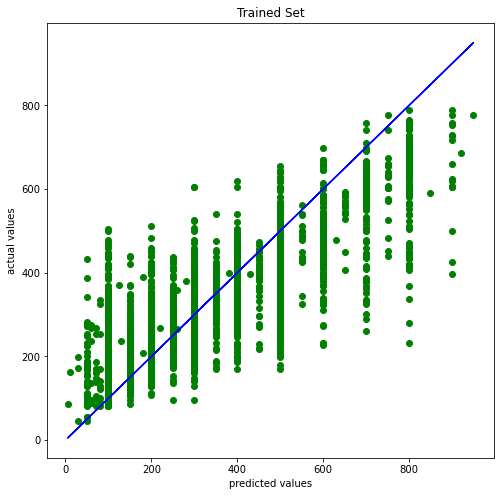

In [119]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_train,y=predrdr,color='g')
plt.plot(y_train,y_train,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Trained Set')
plt.show()

### Hyperparameter Tunning for Random Forest Regressor

In [120]:
%%time
modelr =RandomForestRegressor()
parameters = {
    
    'max_depth': [10, 20, 30, 40, 50, 60],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 4],
 'min_samples_split': [2, 5, 10]
             }

gridrfr = GridSearchCV(modelr,parameters,cv=7)
gridrfr.fit(x_train,y_train)
gridrfr.best_params_

Wall time: 3min 17s


{'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 5}

In [121]:
predrfrr=gridrfr.predict(x_train)
R2_score=r2_score(y_train,predrfrr)
print('The R2_score for cv=7 is :',(R2_score*100))

The R2_score for cv=7 is : 28.373550426120765


The R2_score for cv=3 is : 28.084139342406356
    
The R2_score for cv=7 is : 28.458934714878925

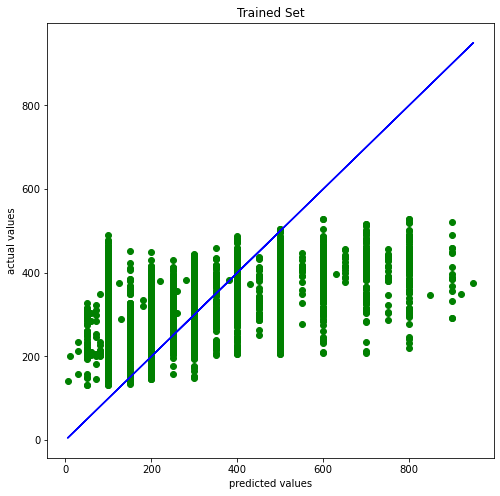

In [122]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_train,y=predrfrr,color='g')
plt.plot(y_train,y_train,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Trained Set')
plt.show()

## XGBoost Regressor Model

In [123]:
XGB = XGBRegressor()
XGB.fit(x_train,y_train)
pred_xgb=XGB.predict(x_train)
print('The r2_score using ridge is:',r2_score(y_train,pred_xgb)*100)

The r2_score using ridge is: 57.504388953448924


In [124]:
print('Error')

print('Mean absolute error',mean_absolute_error(y_train,pred_xgb))
print('Mean squared error',mean_squared_error(y_train,pred_xgb))
print('Root mean squared error',np.sqrt(mean_squared_error(y_train,pred_xgb)))

Error
Mean absolute error 94.079783185445
Mean squared error 15759.468640041667
Root mean squared error 125.53672227695634


##### r2_square for XGBoost is 57.50 which we less than random forest regressor and also MSE,RMSE is higher compare to random forest model.

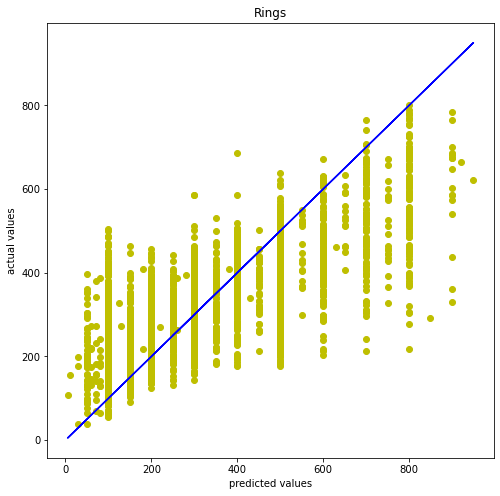

In [125]:
plt.figure(figsize=(8,8))
plt.scatter(x=y_train,y=pred_xgb,color='y')
plt.plot(y_train,y_train,color='b')
plt.xlabel('predicted values')
plt.ylabel('actual values')
plt.title('Rings')
plt.show()

### Hyperparameter Tunning for XGBoost Regressor

In [126]:
modelx =XGBRegressor()
parameters = {'max_depth':[1,4,6,10],'eta':[0.001,0.01,0.3,0.2],'subsample':[0.2,0.5,0.6]}
gridx = GridSearchCV(modelx,parameters,cv=7)
gridx.fit(x_train,y_train)
gridx.best_params_

{'eta': 0.3, 'max_depth': 1, 'subsample': 0.6}

In [127]:
predxg=gridx.predict(x_train)
R2_score=r2_score(y_train,predxg)
print('The R2_score for cv=7 is :',(R2_score*100))

The R2_score for cv=7 is : 20.952045755864358


The R2_score for cv=3 is : 20.604873419930925
    
The R2_score for cv=7 is : 20.952045755864358    

## TEST EXECUTION

In [128]:
y_prediction=rdr.predict(test)

y_prediction

In [129]:
y_fin=pd.DataFrame({'Fees':y_prediction})

In [130]:
y_fin

,Fees
0,252.150000
1,492.600000
2,334.291667
3,119.300000
4,321.377428
5,304.686508
6,387.577778
7,260.265029
8,171.274603
9,321.000000


In [131]:
TEST=y_fin.round(1)

In [132]:
TEST

,Fees
0,252.2
1,492.6
2,334.3
3,119.3
4,321.4
5,304.7
6,387.6
7,260.3
8,171.3
9,321.0


### Above are the predicted values for test dataset.